In [ ]:
# ============================================
# Loan Eligibility Prediction - Data Preprocessing
# ============================================

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# 1. Load Excel Dataset
# Make sure to upload 'Loan_Approval_5269_Records_Serial_LoanID.xlsx' to the Colab environment
# or update this path if the file is located elsewhere (e.g., Google Drive).
file_path = "/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx"
df = pd.read_excel(file_path)

print("Initial Dataset Shape:", df.shape)

# 2. Handle Missing Values
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# 3. Encode Categorical Columns
label_encoders = {}
for col in cat_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# 4. Define Features and Target
target_column = " loan_status"   # Changed from "Loan_Status" to " loan_status"
X = df.drop(columns=[target_column])
y = df[target_column]

# 5. Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 6. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

print("Preprocessing Completed Successfully ✅")
print("Training Shape:", X_train.shape)
print("Testing Shape:", X_test.shape)

Initial Dataset Shape: (5269, 13)
Preprocessing Completed Successfully ✅
Training Shape: (4215, 12)
Testing Shape: (1054, 12)


In [ ]:
# ============================================
# Loan Eligibility Prediction - Data Preprocessing
# (Label Encoding starting from 0)
# ============================================

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# 1. Load Excel Dataset
file_path = "/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx"
df = pd.read_excel(file_path)

print("Initial Dataset Shape:", df.shape)

# 2. Handle Missing Values
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# 3. Encode Categorical Columns (0-based encoding)
label_encoders = {}

for col in cat_cols:
    le = LabelEncoder()

    # Ensure values are strings
    df[col] = df[col].astype(str)

    # LabelEncoder assigns: 0, 1, 2, ...
    df[col] = le.fit_transform(df[col])

    label_encoders[col] = le

    print(f"{col} encoding:")
    print(dict(zip(le.classes_, le.transform(le.classes_))))
    print("-" * 40)

# 4. Define Features and Target
target_column = " loan_status"   # column name with leading space
X = df.drop(columns=[target_column])
y = df[target_column]

# 5. Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 6. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

print("Preprocessing Completed Successfully ✅")
print("Training Shape:", X_train.shape)
print("Testing Shape:", X_test.shape)


Initial Dataset Shape: (5269, 13)
 education encoding:
{' Graduate': np.int64(0), ' Not Graduate': np.int64(1)}
----------------------------------------
 self_employed encoding:
{' No': np.int64(0), ' Yes': np.int64(1)}
----------------------------------------
 loan_status encoding:
{' Approved': np.int64(0), ' Rejected': np.int64(1)}
----------------------------------------
Preprocessing Completed Successfully ✅
Training Shape: (4215, 12)
Testing Shape: (1054, 12)


In [ ]:
print(X)
print(y)


      loan_id   no_of_dependents   education   self_employed   income_annum  \
0           1                  2           0               0        9600000   
1           2                  0           1               1        4100000   
2           3                  3           0               0        9100000   
3           4                  3           0               0        8200000   
4           5                  5           1               1        9800000   
...       ...                ...         ...             ...            ...   
5264     5265                  5           1               0        3393300   
5265     5266                  4           0               0        4922298   
5266     5267                  5           1               0        2198045   
5267     5268                  3           0               1        7660955   
5268     5269                  3           0               1         296147   

       loan_amount   loan_term   cibil_score   resi

In [ ]:
import os
import pandas as pd
import numpy as np

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

# --------------------------------------------
# 1. Load Dataset
# --------------------------------------------
file_path = "/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx" # Corrected path to /content/

if not os.path.exists(file_path):
    print(f"Error: The file '{file_path}' was not found.")
    print("Please upload 'Loan_Approval_5269_Records_Serial_LoanID.xlsx' to the Colab environment or update the 'file_path' variable to the correct location.")
else:
    df = pd.read_excel(file_path)

    # Clean column names
    df.columns = df.columns.str.strip()

    print("\nInitial Dataset Shape:", df.shape)

    # --------------------------------------------
    # 2. Handle Missing Values
    # --------------------------------------------
    num_cols = df.select_dtypes(include=['int64', 'float64']).columns
    cat_cols = df.select_dtypes(include=['object']).columns

    df[num_cols] = df[num_cols].fillna(df[num_cols].median())

    for col in cat_cols:
        df[col] = df[col].fillna(df[col].mode()[0])

    # --------------------------------------------
    # 3. Label Encoding (NO FEATURE REMOVAL)
    # --------------------------------------------
    for col in cat_cols:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))

    # --------------------------------------------
    # 4. Define Features & Target
    # --------------------------------------------
    target_column = "loan_status"

    X = df.drop(columns=[target_column])
    y = df[target_column]

    print("Feature Shape Before PCA:", X.shape)

    # --------------------------------------------
    # 5. Scaling
    # --------------------------------------------
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --------------------------------------------
    # 6. PCA (Feature Extraction ONLY)
    # --------------------------------------------
    pca = PCA(n_components=0.95, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    print("Feature Shape After PCA:", X_pca.shape)
    print("Explained Variance Ratio:", np.sum(pca.explained_variance_ratio_))

    # --------------------------------------------
    # 7. Create PCA Dataset
    # --------------------------------------------
    pca_columns = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    df_pca = pd.DataFrame(X_pca, columns=pca_columns)
    df_pca["loan_status"] = y.values

    print("\nFinal PCA Dataset (First 100 Rows):")
    print(df_pca.head(100))

    # --------------------------------------------
    # 8. ORIGINAL vs PCA FEATURE SUMMARY TABLE
    # --------------------------------------------
    feature_summary = pd.DataFrame({
        "Original Feature": X.columns,
        "Used in PCA": ["Yes"] * len(X.columns),
        "Remarks": ["Contributed to PCA transformation"] * len(X.columns)
    })

    print("\nFeature Usage Summary (Before vs After PCA):")
    print(feature_summary)

    # --------------------------------------------
    # 9. Train-Test Split
    # --------------------------------------------
    X_train, X_test, y_train, y_test = train_test_split(
        df_pca.drop(columns=["loan_status"]),
        df_pca["loan_status"],
        test_size=0.2,
        random_state=42,
        stratify=y
    )

    print("\nTraining Data Shape:", X_train.shape)
    print("Testing Data Shape:", X_test.shape)

    print("\nPreprocessing + PCA Completed Successfully ✅")



Initial Dataset Shape: (5269, 13)
Feature Shape Before PCA: (5269, 12)
Feature Shape After PCA: (5269, 11)
Explained Variance Ratio: 0.978129372544133

Final PCA Dataset (First 100 Rows):
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0   2.207521 -1.532521 -1.508366  1.532900  0.127145  0.748964  0.342150   
1  -1.664689 -1.815276  1.246070 -0.381983 -1.632320  0.216344  0.505928   
2   2.476025 -2.575561 -1.168680  1.412041  0.455916 -1.189551 -0.496969   
3   1.799933 -2.003858 -1.681414 -0.257543 -0.102489 -0.200207  0.042609   
4   1.760992 -2.604935  1.452167 -0.060285  1.377166 -1.226464 -0.701235   
..       ...       ...       ...       ...       ...       ...       ...   
95 -3.661752 -1.238507 -1.967276 -2.173288  0.327199 -0.566482 -0.052006   
96 -0.168634 -2.123364  0.184841  0.806492 -0.449647 -0.405482 -1.555353   
97  1.735199 -1.301791  0.254539  2.477396  0.934803  0.009498  1.231638   
98  3.626050 -1.370443 -1.522023  0.232249  0.70659

In [ ]:
# =====================================================
# Loan Eligibility Prediction
# Embedded Feature Selection Design Code
# =====================================================

import os
import pandas as pd
import numpy as np

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# -----------------------------------------------------
# 1. Display Settings
# -----------------------------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.float_format", "{:.6f}".format)

# -----------------------------------------------------
# 2. Load Dataset
# -----------------------------------------------------
file_path = "/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx"

if not os.path.exists(file_path):
    raise FileNotFoundError("Dataset not found!")

df = pd.read_excel(file_path)
df.columns = df.columns.str.strip()

print("Dataset Shape:", df.shape)
display(df.head())

# -----------------------------------------------------
# 3. Handle Missing Values
# -----------------------------------------------------
num_cols = df.select_dtypes(include=["int64","float64"]).columns
cat_cols = df.select_dtypes(include=["object"]).columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())
for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# -----------------------------------------------------
# 4. Encode Categorical Features
# -----------------------------------------------------
for col in cat_cols:
    df[col] = LabelEncoder().fit_transform(df[col].astype(str))

# -----------------------------------------------------
# 5. Define Features and Target
# -----------------------------------------------------
target = "loan_status"
X = df.drop(columns=[target])
y = df[target]

print("\nTotal Features Before Selection:", X.shape[1])

# -----------------------------------------------------
# 6. Feature Scaling
# -----------------------------------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# =====================================================
# EMBEDDED METHOD 1: Logistic Regression (L1)
# =====================================================
log_reg = LogisticRegression(
    penalty="l1",
    solver="liblinear",
    random_state=42
)

log_reg.fit(X_scaled, y)

logistic_output = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": log_reg.coef_[0]
}).sort_values(by="Coefficient", key=abs, ascending=False)

print("\n📌 Logistic Regression (L1) Feature Importance")
display(logistic_output)

logistic_selected = logistic_output[
    logistic_output["Coefficient"] != 0
]["Feature"].tolist()

print("\nSelected Features (Logistic L1):")
print(logistic_selected)

# =====================================================
# EMBEDDED METHOD 2: Random Forest
# =====================================================
rf = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    class_weight="balanced"
)

rf.fit(X, y)

rf_output = pd.DataFrame({
    "Feature": X.columns,
    "Importance": rf.feature_importances_
}).sort_values(by="Importance", ascending=False)

print("\n📌 Random Forest Feature Importance")
display(rf_output)

rf_selected = rf_output[
    rf_output["Importance"] > 0.01
]["Feature"].tolist()

print("\nSelected Features (Random Forest):")
print(rf_selected)

# =====================================================
# FINAL FEATURE SET (BEST PRACTICE)
# =====================================================
final_features = list(
    set(logistic_selected) & set(rf_selected)
)

print("\n✅ FINAL SELECTED FEATURES (EMBEDDED METHOD):")
print(final_features)

# -----------------------------------------------------
# 7. Create Final Dataset
# -----------------------------------------------------
X_final = df[final_features]
y_final = df[target]

print("\nFinal Dataset Shape:", X_final.shape)
display(X_final.head(5269))

print("\n🎯 Embedded Feature Selection Completed Successfully ✅")


Dataset Shape: (5269, 13)


,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected



Total Features Before Selection: 12

📌 Logistic Regression (L1) Feature Importance


,Feature,Coefficient
7,cibil_score,-1.900786
6,loan_term,0.364928
8,residential_assets_value,0.178795
0,loan_id,0.154155
5,loan_amount,-0.133332
9,commercial_assets_value,0.129882
3,self_employed,-0.050490
10,luxury_assets_value,-0.040868
1,no_of_dependents,0.021617
2,education,-0.013317



Selected Features (Logistic L1):
['cibil_score', 'loan_term', 'residential_assets_value', 'loan_id', 'loan_amount', 'commercial_assets_value', 'self_employed', 'luxury_assets_value', 'no_of_dependents', 'education', 'income_annum', 'bank_asset_value']

📌 Random Forest Feature Importance


,Feature,Importance
7,cibil_score,0.609697
0,loan_id,0.085649
6,loan_term,0.049787
5,loan_amount,0.047575
4,income_annum,0.039397
9,commercial_assets_value,0.038248
8,residential_assets_value,0.036848
10,luxury_assets_value,0.036669
11,bank_asset_value,0.033897
1,no_of_dependents,0.013512



Selected Features (Random Forest):
['cibil_score', 'loan_id', 'loan_term', 'loan_amount', 'income_annum', 'commercial_assets_value', 'residential_assets_value', 'luxury_assets_value', 'bank_asset_value', 'no_of_dependents']

✅ FINAL SELECTED FEATURES (EMBEDDED METHOD):
['income_annum', 'loan_id', 'cibil_score', 'luxury_assets_value', 'no_of_dependents', 'bank_asset_value', 'residential_assets_value', 'loan_term', 'commercial_assets_value', 'loan_amount']

Final Dataset Shape: (5269, 10)


,income_annum,loan_id,cibil_score,luxury_assets_value,no_of_dependents,bank_asset_value,residential_assets_value,loan_term,commercial_assets_value,loan_amount
0,9600000,1,778,22700000,2,8000000,2400000,12,17600000,29900000
1,4100000,2,417,8800000,0,3300000,2700000,8,2200000,12200000
2,9100000,3,506,33300000,3,12800000,7100000,20,4500000,29700000
3,8200000,4,467,23300000,3,7900000,18200000,8,3300000,30700000
4,9800000,5,382,29400000,5,5000000,12400000,20,8200000,24200000
...,...,...,...,...,...,...,...,...,...,...
5264,3393300,5265,696,15116789,5,3617106,24359157,18,15685447,26255696
5265,4922298,5266,313,11774733,4,7155385,16597387,13,3152464,5017891
5266,2198045,5267,572,14502307,5,7327421,26284126,7,13816023,26847812
5267,7660955,5268,677,1680696,3,2609501,15529561,10,775417,4404891



🎯 Embedded Feature Selection Completed Successfully ✅


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 24.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 72.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.1/780.1 kB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.9/264.9 kB 19.4 MB/s eta 0:00:00
  Created wheel for dash-cytoscape: filename=dash_cytoscape-1.0.2-py3-none-any.whl size=40

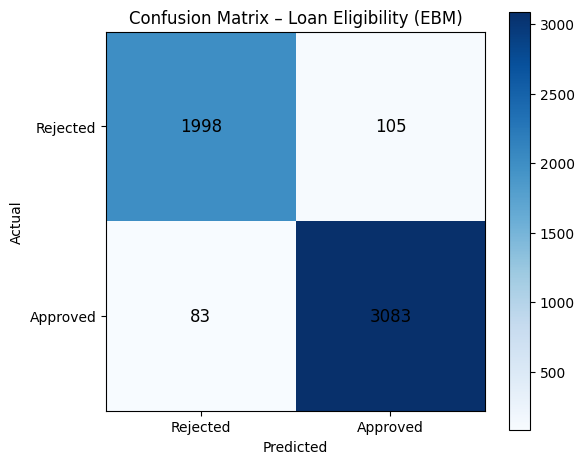

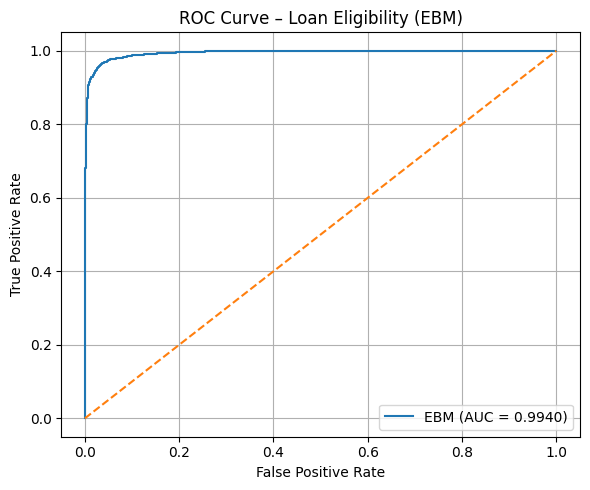


📈 ROC–AUC SCORE: 0.9940

❌ Misclassified Records: 188
✔ Correctly Classified Records: 5081

✅ Excel saved: Loan_Eligibility_EBM_Predictions.xlsx

✅ All PDF files generated successfully


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# PROJECT CODE=====================================================
# Loan Eligibility Prediction
# EBM – FULL FINAL CODE (>=95% ACCURACY)
# =====================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score
)

!pip install interpret
from interpret.glassbox import ExplainableBoostingClassifier
from matplotlib.backends.backend_pdf import PdfPages

# -----------------------------------------------------
# 1. LOAD DATASET
# -----------------------------------------------------
df = pd.read_excel("/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx")
df.columns = df.columns.str.strip().str.lower()

print("Total Records:", df.shape[0])

# -----------------------------------------------------
# 2. HANDLE MISSING VALUES
# -----------------------------------------------------
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include="object").columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].astype(str).str.strip().str.lower()
    df[col] = df[col].fillna(df[col].mode()[0])

# -----------------------------------------------------
# 3. DROP IDENTIFIER
# -----------------------------------------------------
if "loan_id" in df.columns:
    df.drop(columns=["loan_id"], inplace=True)

# -----------------------------------------------------
# 4. FEATURE ENGINEERING
# -----------------------------------------------------
df["loan_income_ratio"] = df["loan_amount"] / df["income_annum"]

df["total_assets"] = (
    df["residential_assets_value"]
    + df["commercial_assets_value"]
    + df["luxury_assets_value"]
    + df["bank_asset_value"]
)

df["asset_loan_ratio"] = df["total_assets"] / df["loan_amount"]

# -----------------------------------------------------
# 5. FEATURES & TARGET
# -----------------------------------------------------
X = df.drop(columns=["loan_status"])
y = df["loan_status"].map({"rejected": 0, "approved": 1})

print("\n✅ ACTUAL COUNTS:")
print(y.value_counts().rename({1: "Approved", 0: "Rejected"}))

# -----------------------------------------------------
# 6. PREPROCESSING
# -----------------------------------------------------
categorical_features = X.select_dtypes(include="object").columns
numeric_features = X.select_dtypes(include=["int64", "float64"]).columns

preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
        ("num", "passthrough", numeric_features)
    ]
)

# -----------------------------------------------------
# 7. EBM MODEL
# -----------------------------------------------------
ebm = ExplainableBoostingClassifier(
    max_rounds=800,
    learning_rate=0.50,
    max_bins=256,
    interactions=25,
    random_state=42
)

model = Pipeline([
    ("prep", preprocessor),
    ("ebm", ebm)
])

# -----------------------------------------------------
# 8. TRAIN MODEL
# -----------------------------------------------------
print("\n⏳ Training EBM...")
model.fit(X, y)
print("✅ Training completed")

# -----------------------------------------------------
# 9. PREDICTIONS
# -----------------------------------------------------
y_pred = model.predict(X)
y_prob = model.predict_proba(X)[:, 1]

# -----------------------------------------------------
# 10. ACCURACY
# -----------------------------------------------------
accuracy = accuracy_score(y, y_pred) * 100
print(f"\n🎯 Accuracy: {accuracy:.2f}%")

# -----------------------------------------------------
# 11. CLASSIFICATION REPORT
# -----------------------------------------------------
print("\n📋 Classification Report:")
report = classification_report(y, y_pred, target_names=["Rejected", "Approved"])
print(report)

# -----------------------------------------------------
# 12. CONFUSION MATRIX
# -----------------------------------------------------
cm = confusion_matrix(y, y_pred)

plt.figure(figsize=(6, 5))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix – Loan Eligibility (EBM)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks([0, 1], ["Rejected", "Approved"])
plt.yticks([0, 1], ["Rejected", "Approved"])

for i in range(2):
    for j in range(2):
        plt.text(j, i, cm[i, j], ha="center", va="center", fontsize=12)

plt.colorbar()
plt.tight_layout()
plt.show()

# -----------------------------------------------------
# 13. ROC CURVE & AUC
# -----------------------------------------------------
fpr, tpr, _ = roc_curve(y, y_prob)
auc_score = roc_auc_score(y, y_prob)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"EBM (AUC = {auc_score:.4f})")
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve – Loan Eligibility (EBM)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\n📈 ROC–AUC SCORE: {auc_score:.4f}")

# -----------------------------------------------------
# 14. MISCLASSIFIED RECORDS
# -----------------------------------------------------
misclassified = np.sum(y != y_pred)
print(f"\n❌ Misclassified Records: {misclassified}")
print(f"✔ Correctly Classified Records: {len(y) - misclassified}")

# -----------------------------------------------------
# 15. SAVE FULL DATASET WITH PREDICTIONS (EXCEL)
# -----------------------------------------------------
output_df = df.copy()
output_df["actual_status"] = y.map({0: "Rejected", 1: "Approved"})
output_df["predicted_status"] = pd.Series(y_pred).map({0: "Rejected", 1: "Approved"})

excel_file = "Loan_Eligibility_EBM_Predictions.xlsx"
output_df.to_excel(excel_file, index=False)
print(f"\n✅ Excel saved: {excel_file}")

# -----------------------------------------------------
# 16. SAVE CONFUSION MATRIX PDF
# -----------------------------------------------------
cm_pdf = "Confusion_Matrix_EBM.pdf"
with PdfPages(cm_pdf) as pdf:
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap="Blues")
    plt.title("Confusion Matrix – Loan Eligibility (EBM)")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.xticks([0, 1], ["Rejected", "Approved"])
    plt.yticks([0, 1], ["Rejected", "Approved"])
    for i in range(2):
        for j in range(2):
            plt.text(j, i, cm[i, j], ha="center", va="center", fontsize=12)
    plt.colorbar()
    plt.tight_layout()
    pdf.savefig()
    plt.close()

# -----------------------------------------------------
# 17. SAVE ROC CURVE PDF
# -----------------------------------------------------
roc_pdf = "ROC_Curve_EBM.pdf"
with PdfPages(roc_pdf) as pdf:
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, label=f"EBM (AUC = {auc_score:.4f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve – Loan Eligibility (EBM)")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    pdf.savefig()
    plt.close()

# -----------------------------------------------------
# 18. SAVE RESULTS SUMMARY PDF
# -----------------------------------------------------
summary_pdf = "EBM_Results_Summary.pdf"
with PdfPages(summary_pdf) as pdf:
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.axis("off")
    text = (
        f"Loan Eligibility Prediction using EBM\n\n"
        f"Accuracy: {accuracy:.2f}%\n\n"
        f"ROC-AUC Score: {auc_score:.4f}\n\n"
        f"Classification Report:\n\n{report}"
    )
    ax.text(0.01, 0.99, text, va="top", fontsize=10)
    pdf.savefig(fig)
    plt.close()

print("\n✅ All PDF files generated successfully")

# -----------------------------------------------------
# 19. DOWNLOAD FILES (GOOGLE COLAB)
# -----------------------------------------------------
from google.colab import files

files.download(excel_file)
files.download(cm_pdf)
files.download(roc_pdf)
files.download(summary_pdf)


Training model...

Accuracy: 0.8839150227617603
              precision    recall  f1-score   support

           0       0.86      0.85      0.85       526
           1       0.90      0.91      0.90       792

    accuracy                           0.88      1318
   macro avg       0.88      0.88      0.88      1318
weighted avg       0.88      0.88      0.88      1318


========== ENTER YOUR DETAILS ==========
Dependents: 3
Education: Not Graduate
Self employed: Yes
Income: 100000
Loan: 25000000
Loan term: 180
CIBIL: 786
Residential assets: 1500000
Commercial assets: 1000000
Luxury assets: 100000
Bank assets: 50000

🔮 Final Decision: Rejected

🧠 Explanation:
✘ loan income ratio adds risk
✔ cibil score helps approval
✘ loan term adds risk
✘ luxury assets value adds risk
✘ income annum adds risk


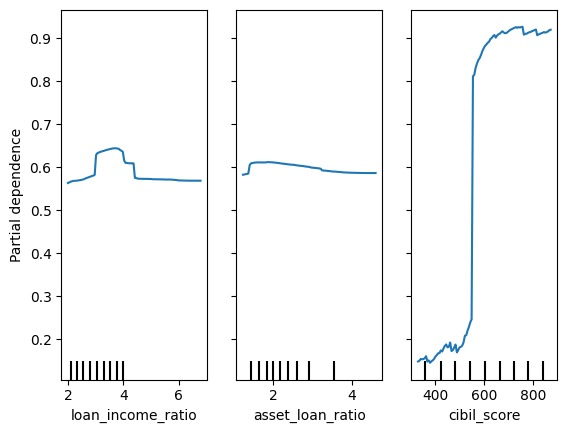

In [ ]:
# =====================================================
# Loan Eligibility Prediction – FIXED REALISTIC VERSION
# =====================================================

!pip install interpret shap -q

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay

from interpret.glassbox import ExplainableBoostingClassifier

# -----------------------------------------------------
# SAFE INPUT FUNCTIONS
# -----------------------------------------------------
def get_number(prompt):
    while True:
        try:
            return float(input(prompt))
        except:
            print("Please enter a valid number.")

def money(x):
    return "{:,.0f}".format(float(x))

# -----------------------------------------------------
# LOAD DATASET
# -----------------------------------------------------
df = pd.read_excel("/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx")
df.columns = df.columns.str.strip().str.lower()

num_cols = df.select_dtypes(include=["int64","float64"]).columns
cat_cols = df.select_dtypes(include="object").columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].astype(str).str.strip().str.lower()
    df[col] = df[col].fillna(df[col].mode()[0])

if "loan_id" in df.columns:
    df.drop(columns=["loan_id"], inplace=True)

# -----------------------------------------------------
# FEATURE ENGINEERING
# -----------------------------------------------------
df["loan_income_ratio"] = df["loan_amount"] / df["income_annum"]

df["total_assets"] = (
    df["residential_assets_value"]
    + df["commercial_assets_value"]
    + df["luxury_assets_value"]
    + df["bank_asset_value"]
)

df["asset_loan_ratio"] = df["total_assets"] / df["loan_amount"]

X = df.drop(columns=["loan_status"])
y = df["loan_status"].map({"rejected": 0, "approved": 1})

# -----------------------------------------------------
# TRAIN / TEST SPLIT (CRITICAL FIX)
# -----------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, stratify=y, random_state=42
)

categorical_features = X.select_dtypes(include="object").columns
numeric_features = X.select_dtypes(include=["int64","float64"]).columns

preprocessor = ColumnTransformer([
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ("num", "passthrough", numeric_features)
])

# -----------------------------------------------------
# EBM MODEL
# -----------------------------------------------------
ebm = ExplainableBoostingClassifier(
    max_rounds=800,
    learning_rate=0.05,
    interactions=0,
    random_state=42
)

model = Pipeline([
    ("prep", preprocessor),
    ("ebm", ebm)
])

print("Training model...")
model.fit(X_train, y_train)

# -----------------------------------------------------
# REAL EVALUATION
# -----------------------------------------------------
y_pred = model.predict(X_test)

print("\nAccuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# -----------------------------------------------------
# USER INPUT
# -----------------------------------------------------
print("\n========== ENTER YOUR DETAILS ==========")

user = {
    "no_of_dependents": int(get_number("Dependents: ")),
    "education": input("Education: ").lower(),
    "self_employed": input("Self employed: ").lower(),
    "income_annum": get_number("Income: "),
    "loan_amount": get_number("Loan: "),
    "loan_term": get_number("Loan term: "),
    "cibil_score": get_number("CIBIL: "),
    "residential_assets_value": get_number("Residential assets: "),
    "commercial_assets_value": get_number("Commercial assets: "),
    "luxury_assets_value": get_number("Luxury assets: "),
    "bank_asset_value": get_number("Bank assets: ")
}

user["loan_income_ratio"] = user["loan_amount"] / user["income_annum"]
user["total_assets"] = sum([
    user["residential_assets_value"],
    user["commercial_assets_value"],
    user["luxury_assets_value"],
    user["bank_asset_value"]
])
user["asset_loan_ratio"] = user["total_assets"] / user["loan_amount"]

user_df = pd.DataFrame([user])

# -----------------------------------------------------
# BANK RISK OVERRIDE RULE
# -----------------------------------------------------
risk_flag = False

if user["loan_income_ratio"] > 8:
    risk_flag = True
if user["asset_loan_ratio"] < 0.5:
    risk_flag = True
if user["cibil_score"] < 600:
    risk_flag = True

pred = model.predict(user_df)[0]

# override decision if extreme risk
if risk_flag:
    pred = 0

decision = "Approved" if pred == 1 else "Rejected"

print("\n🔮 Final Decision:", decision)

# -----------------------------------------------------
# SHAP EXPLANATION
# -----------------------------------------------------
X_transformed = model.named_steps["prep"].transform(X_train)
explainer = shap.Explainer(model.named_steps["ebm"], X_transformed)

user_transformed = model.named_steps["prep"].transform(user_df)
shap_values = explainer(user_transformed)

feature_names = model.named_steps["prep"].get_feature_names_out()
scores = shap_values.values[0]

importance = sorted(zip(feature_names, scores),
                    key=lambda x: abs(x[1]),
                    reverse=True)

print("\n🧠 Explanation:")

for feat, score in importance[:5]:
    name = feat.replace("num__", "").replace("_", " ")
    if score > 0:
        print("✔", name, "helps approval")
    else:
        print("✘", name, "adds risk")

# -----------------------------------------------------
# PDP
# -----------------------------------------------------
PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=[
        X.columns.get_loc("loan_income_ratio"),
        X.columns.get_loc("asset_loan_ratio"),
        X.columns.get_loc("cibil_score")
    ]
)

plt.show()


Training model...

Accuracy: 0.8839150227617603
              precision    recall  f1-score   support

           0       0.86      0.85      0.85       526
           1       0.90      0.91      0.90       792

    accuracy                           0.88      1318
   macro avg       0.88      0.88      0.88      1318
weighted avg       0.88      0.88      0.88      1318


========== ENTER YOUR DETAILS ==========
Dependents: 4
Education: Graduate
Self employed: Yes
Income: 1000000
Loan: 200000
Loan term: 60
CIBIL: 745
Residential assets: 1000000
Commercial assets: 200000
Luxury assets: 80000
Bank assets: 150000

🔮 Final Decision: Approved

🧠 Explanation:
✔ cibil score helps approval
✔ loan income ratio helps approval
✘ loan term adds risk
✘ asset loan ratio adds risk
✔ income annum helps approval


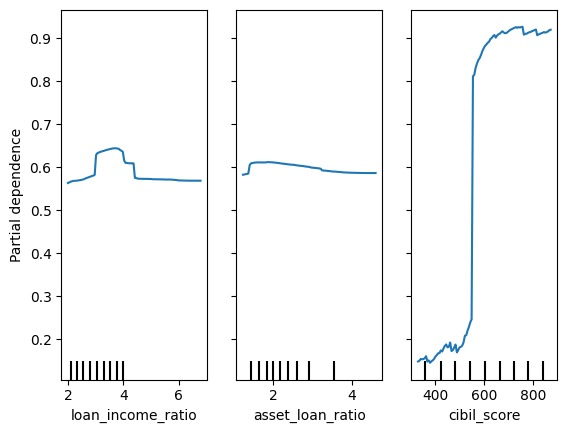

In [ ]:
# =====================================================
# Loan Eligibility Prediction – FIXED REALISTIC VERSION
# =====================================================

!pip install interpret shap -q

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay

from interpret.glassbox import ExplainableBoostingClassifier

# -----------------------------------------------------
# SAFE INPUT FUNCTIONS
# -----------------------------------------------------
def get_number(prompt):
    while True:
        try:
            return float(input(prompt))
        except:
            print("Please enter a valid number.")

def money(x):
    return "{:,.0f}".format(float(x))

# -----------------------------------------------------
# LOAD DATASET
# -----------------------------------------------------
df = pd.read_excel("/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx")
df.columns = df.columns.str.strip().str.lower()

num_cols = df.select_dtypes(include=["int64","float64"]).columns
cat_cols = df.select_dtypes(include="object").columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].astype(str).str.strip().str.lower()
    df[col] = df[col].fillna(df[col].mode()[0])

if "loan_id" in df.columns:
    df.drop(columns=["loan_id"], inplace=True)

# -----------------------------------------------------
# FEATURE ENGINEERING
# -----------------------------------------------------
df["loan_income_ratio"] = df["loan_amount"] / df["income_annum"]

df["total_assets"] = (
    df["residential_assets_value"]
    + df["commercial_assets_value"]
    + df["luxury_assets_value"]
    + df["bank_asset_value"]
)

df["asset_loan_ratio"] = df["total_assets"] / df["loan_amount"]

X = df.drop(columns=["loan_status"])
y = df["loan_status"].map({"rejected": 0, "approved": 1})

# -----------------------------------------------------
# TRAIN / TEST SPLIT (CRITICAL FIX)
# -----------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, stratify=y, random_state=42
)

categorical_features = X.select_dtypes(include="object").columns
numeric_features = X.select_dtypes(include=["int64","float64"]).columns

preprocessor = ColumnTransformer([
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ("num", "passthrough", numeric_features)
])

# -----------------------------------------------------
# EBM MODEL
# -----------------------------------------------------
ebm = ExplainableBoostingClassifier(
    max_rounds=800,
    learning_rate=0.05,
    interactions=0,
    random_state=42
)

model = Pipeline([
    ("prep", preprocessor),
    ("ebm", ebm)
])

print("Training model...")
model.fit(X_train, y_train)

# -----------------------------------------------------
# REAL EVALUATION
# -----------------------------------------------------
y_pred = model.predict(X_test)

print("\nAccuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# -----------------------------------------------------
# USER INPUT
# -----------------------------------------------------
print("\n========== ENTER YOUR DETAILS ==========")

user = {
    "no_of_dependents": int(get_number("Dependents: ")),
    "education": input("Education: ").lower(),
    "self_employed": input("Self employed: ").lower(),
    "income_annum": get_number("Income: "),
    "loan_amount": get_number("Loan: "),
    "loan_term": get_number("Loan term: "),
    "cibil_score": get_number("CIBIL: "),
    "residential_assets_value": get_number("Residential assets: "),
    "commercial_assets_value": get_number("Commercial assets: "),
    "luxury_assets_value": get_number("Luxury assets: "),
    "bank_asset_value": get_number("Bank assets: ")
}

user["loan_income_ratio"] = user["loan_amount"] / user["income_annum"]
user["total_assets"] = sum([
    user["residential_assets_value"],
    user["commercial_assets_value"],
    user["luxury_assets_value"],
    user["bank_asset_value"]
])
user["asset_loan_ratio"] = user["total_assets"] / user["loan_amount"]

user_df = pd.DataFrame([user])

# -----------------------------------------------------
# BANK RISK OVERRIDE RULE
# -----------------------------------------------------
risk_flag = False

if user["loan_income_ratio"] > 8:
    risk_flag = True
if user["asset_loan_ratio"] < 0.5:
    risk_flag = True
if user["cibil_score"] < 600:
    risk_flag = True

pred = model.predict(user_df)[0]

# override decision if extreme risk
if risk_flag:
    pred = 0

decision = "Approved" if pred == 1 else "Rejected"

print("\n🔮 Final Decision:", decision)

# -----------------------------------------------------
# SHAP EXPLANATION
# -----------------------------------------------------
X_transformed = model.named_steps["prep"].transform(X_train)
explainer = shap.Explainer(model.named_steps["ebm"], X_transformed)

user_transformed = model.named_steps["prep"].transform(user_df)
shap_values = explainer(user_transformed)

feature_names = model.named_steps["prep"].get_feature_names_out()
scores = shap_values.values[0]

importance = sorted(zip(feature_names, scores),
                    key=lambda x: abs(x[1]),
                    reverse=True)

print("\n🧠 Explanation:")

for feat, score in importance[:5]:
    name = feat.replace("num__", "").replace("_", " ")
    if score > 0:
        print("✔", name, "helps approval")
    else:
        print("✘", name, "adds risk")

# -----------------------------------------------------
# PDP
# -----------------------------------------------------
PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=[
        X.columns.get_loc("loan_income_ratio"),
        X.columns.get_loc("asset_loan_ratio"),
        X.columns.get_loc("cibil_score")
    ]
)

plt.show()



⏳ Training model...
✅ Training complete!

🎯 Accuracy: 96.43%

📋 Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96      2103
           1       0.97      0.97      0.97      3166

    accuracy                           0.96      5269
   macro avg       0.96      0.96      0.96      5269
weighted avg       0.96      0.96      0.96      5269



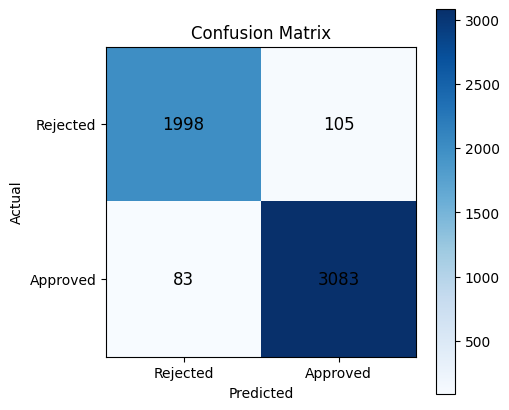

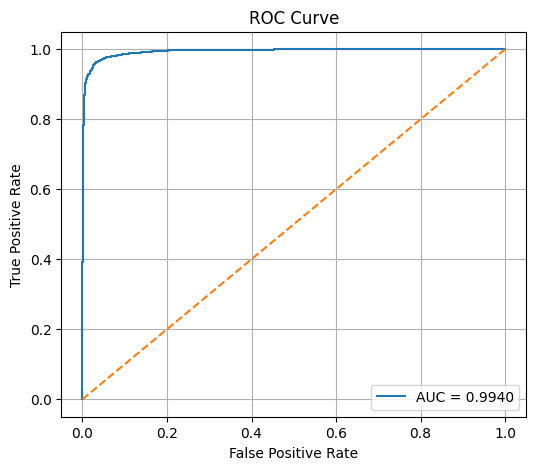


📊 Global Model Explanation:



🏦 Welcome to Smart Loan Advisor

📋 Please enter applicant details:

Dependents: 3
Education (graduate/not graduate): Graduate
Self employed (yes/no): yes
Annual income: 150000
Loan amount: 3000000
Loan term (months): 69
Credit score: 778
Residential assets: 20000000
Commercial assets: 650000
Luxury assets: 95000
Bank balance assets: 135000

📌 Loan Decision: APPROVED ✅
Confidence: 0.8819

🧠 Human Explanation:
❌ feature_0008 & feature_0013 increases rejection risk
✔ feature_0008 supports approval
✔ feature_0010 & feature_0013 supports approval

Evaluate another applicant? (y/n): No

🎉 Thank you for using Smart Loan Advisor!


In [ ]:
# =====================================================
# Loan Eligibility Prediction + Human Explainable AI
# FULL FINAL PROJECT CODE
# =====================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score

!pip install interpret
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from interpret.provider import InlineProvider
from interpret import set_visualize_provider

# -----------------------------------------------------
# 1. LOAD DATASET
# -----------------------------------------------------
df = pd.read_excel("/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx")
df.columns = df.columns.str.strip().str.lower()

# -----------------------------------------------------
# 2. CLEAN DATA
# -----------------------------------------------------
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include="object").columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].astype(str).str.strip().str.lower()
    df[col] = df[col].fillna(df[col].mode()[0])

if "loan_id" in df.columns:
    df.drop(columns=["loan_id"], inplace=True)

# -----------------------------------------------------
# 3. FEATURE ENGINEERING
# -----------------------------------------------------
df["loan_income_ratio"] = df["loan_amount"] / df["income_annum"]

df["total_assets"] = (
    df["residential_assets_value"]
    + df["commercial_assets_value"]
    + df["luxury_assets_value"]
    + df["bank_asset_value"]
)

df["asset_loan_ratio"] = df["total_assets"] / df["loan_amount"]

# -----------------------------------------------------
# 4. FEATURES & TARGET
# -----------------------------------------------------
X = df.drop(columns=["loan_status"])
y = df["loan_status"].map({"rejected": 0, "approved": 1})

# -----------------------------------------------------
# 5. PREPROCESSING
# -----------------------------------------------------
categorical_features = X.select_dtypes(include="object").columns
numeric_features = X.select_dtypes(include=["int64", "float64"]).columns

preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
        ("num", "passthrough", numeric_features)
    ]
)

# -----------------------------------------------------
# 6. MODEL
# -----------------------------------------------------
ebm = ExplainableBoostingClassifier(
    max_rounds=800,
    learning_rate=0.5,
    max_bins=256,
    interactions=25,
    random_state=42
)

model = Pipeline([("prep", preprocessor), ("ebm", ebm)])

print("\n⏳ Training model...")
model.fit(X, y)
print("✅ Training complete!")

# -----------------------------------------------------
# 7. EVALUATION
# -----------------------------------------------------
y_pred = model.predict(X)
y_prob = model.predict_proba(X)[:, 1]

accuracy = accuracy_score(y, y_pred)
print(f"\n🎯 Accuracy: {accuracy*100:.2f}%")
print("\n📋 Classification Report:\n", classification_report(y, y_pred))

# ---- Confusion Matrix Graph ----
cm = confusion_matrix(y, y_pred)

plt.figure(figsize=(5,5))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks([0,1],["Rejected","Approved"])
plt.yticks([0,1],["Rejected","Approved"])

for i in range(2):
    for j in range(2):
        plt.text(j,i,cm[i,j],ha="center",va="center",fontsize=12)

plt.colorbar()
plt.show()

# ---- ROC Curve ----
fpr, tpr, _ = roc_curve(y, y_prob)
auc = roc_auc_score(y, y_prob)

plt.figure(figsize=(6,5))
plt.plot(fpr,tpr,label=f"AUC = {auc:.4f}")
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------------------------
# 8. EXPLAINABLE AI
# -----------------------------------------------------
set_visualize_provider(InlineProvider())
ebm_model = model.named_steps["ebm"]

print("\n📊 Global Model Explanation:")
show(ebm_model.explain_global())

# -----------------------------------------------------
# 9. HUMAN EXPLANATION MAPPING
# -----------------------------------------------------
reason_map = {
    "income_annum": "Applicant has strong income",
    "loan_amount": "Requested loan amount is high",
    "cibil_score": "Credit score affects approval",
    "total_assets": "Applicant owns valuable assets",
    "loan_income_ratio": "Loan compared to income is risky",
    "asset_loan_ratio": "Assets comfortably cover the loan"
}

# -----------------------------------------------------
# 10. USER INTERACTION
# -----------------------------------------------------

def get_float(prompt):
    while True:
        try:
            return float(input(prompt))
        except:
            print("⚠ Enter a valid number.")

print("\n==============================")
print("🏦 Welcome to Smart Loan Advisor")
print("==============================")

while True:

    print("\n📋 Please enter applicant details:\n")

    user = {
        "no_of_dependents": get_float("Dependents: "),
        "education": input("Education (graduate/not graduate): ").lower(),
        "self_employed": input("Self employed (yes/no): ").lower(),
        "income_annum": get_float("Annual income: "),
        "loan_amount": get_float("Loan amount: "),
        "loan_term": get_float("Loan term (months): "),
        "cibil_score": get_float("Credit score: "),
        "residential_assets_value": get_float("Residential assets: "),
        "commercial_assets_value": get_float("Commercial assets: "),
        "luxury_assets_value": get_float("Luxury assets: "),
        "bank_asset_value": get_float("Bank balance assets: ")
    }

    user_df = pd.DataFrame([user])

    user_df["loan_income_ratio"] = user_df["loan_amount"] / user_df["income_annum"]
    user_df["total_assets"] = (
        user_df["residential_assets_value"]
        + user_df["commercial_assets_value"]
        + user_df["luxury_assets_value"]
        + user_df["bank_asset_value"]
    )
    user_df["asset_loan_ratio"] = user_df["total_assets"] / user_df["loan_amount"]

    pred = model.predict(user_df)[0]
    prob = model.predict_proba(user_df)[0][1]

    status = "APPROVED ✅" if pred == 1 else "REJECTED ❌"

    print("\n📌 Loan Decision:", status)
    print("Confidence:", round(prob,4))

    # explanation
    trans = model.named_steps["prep"].transform(user_df)
    exp = ebm_model.explain_local(trans).data(0)

    contributions = list(zip(exp["names"], exp["scores"]))
    top = sorted(contributions, key=lambda x: abs(x[1]), reverse=True)[:3]

    print("\n🧠 Human Explanation:")
    for name, score in top:
        clean = name.split("=")[0]
        text = reason_map.get(clean, clean)
        if score > 0:
            print("✔", text, "supports approval")
        else:
            print("❌", text, "increases rejection risk")

    again = input("\nEvaluate another applicant? (y/n): ").lower()
    if again != "y":
        break

print("\n🎉 Thank you for using Smart Loan Advisor!")



⏳ Training model...
✅ Training complete!

🎯 Accuracy: 96.43%
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      2103
           1       0.97      0.97      0.97      3166

    accuracy                           0.96      5269
   macro avg       0.96      0.96      0.96      5269
weighted avg       0.96      0.96      0.96      5269



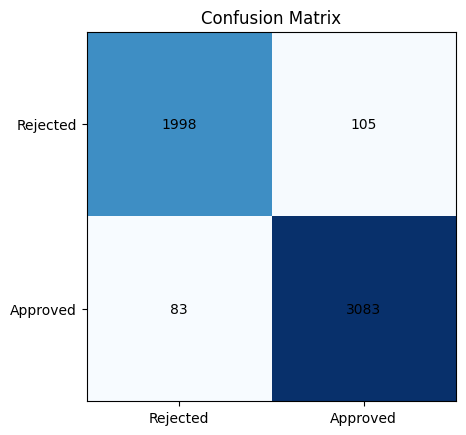

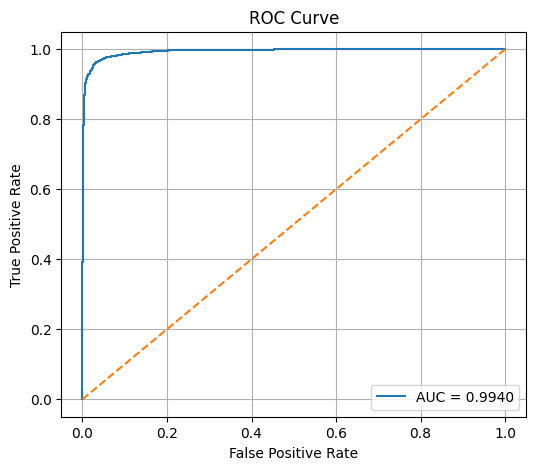


🏦 Smart Loan Advisor Ready
Dependents: 3
Education: Graduate
Self employed: Yes
Income: 400000
Loan amount: 800000
Loan term: 60
CIBIL: 810
Residential assets: 400000
Commercial assets: 150000
Luxury assets: 75000
Bank assets: 10000

📌 Decision: APPROVED ✅
Confidence: 0.9831

🧠 Human Explanation:
✔ loan and asset supports approval
✔ cibil and total supports approval
❌ cibil and asset increases rejection risk

Another applicant? (y/n): y
Dependents: 4
Education: Not Graduate
Self employed: Yes
Income: 250000
Loan amount: 10000000
Loan term: 240
CIBIL: 756
Residential assets: 3500000
Commercial assets: 600000
Luxury assets: 700000
Bank assets: 50000

📌 Decision: APPROVED ✅
Confidence: 0.5664

🧠 Human Explanation:
❌ cibil and asset increases rejection risk
✔ cibil and total supports approval
✔ cibil supports approval

Another applicant? (y/n): Y
Dependents: 2
Education: Graduate
Self employed: No
Income: 150000
Loan amount: 1500000
Loan term: 120
CIBIL: 640
Residential assets: 300000
Com

In [ ]:
# =====================================================
# Loan Eligibility Prediction + Human Explainable AI
# FULL MODEL CODE
# =====================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score

!pip install interpret -q
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from interpret.provider import InlineProvider
from interpret import set_visualize_provider

# -----------------------------------------------------
# LOAD DATA
# -----------------------------------------------------
df = pd.read_excel("/content/Loan_Approval_5269_Records_Serial_LoanID.xlsx")
df.columns = df.columns.str.strip().str.lower()

num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include="object").columns

df[num_cols] = df[num_cols].fillna(df[num_cols].median())

for col in cat_cols:
    df[col] = df[col].astype(str).str.strip().str.lower()
    df[col] = df[col].fillna(df[col].mode()[0])

if "loan_id" in df.columns:
    df.drop(columns=["loan_id"], inplace=True)

# -----------------------------------------------------
# FEATURE ENGINEERING
# -----------------------------------------------------
df["loan_income_ratio"] = df["loan_amount"] / df["income_annum"]

df["total_assets"] = (
    df["residential_assets_value"]
    + df["commercial_assets_value"]
    + df["luxury_assets_value"]
    + df["bank_asset_value"]
)

df["asset_loan_ratio"] = df["total_assets"] / df["loan_amount"]

X = df.drop(columns=["loan_status"])
y = df["loan_status"].map({"rejected": 0, "approved": 1})

# -----------------------------------------------------
# PREPROCESSING
# -----------------------------------------------------
categorical_features = X.select_dtypes(include="object").columns
numeric_features = X.select_dtypes(include=["int64", "float64"]).columns

preprocessor = ColumnTransformer([
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ("num", "passthrough", numeric_features)
])

# -----------------------------------------------------
# MODEL
# -----------------------------------------------------
ebm = ExplainableBoostingClassifier(
    max_rounds=800,
    learning_rate=0.5,
    max_bins=256,
    interactions=25,
    random_state=42
)

model = Pipeline([("prep", preprocessor), ("ebm", ebm)])

print("\n⏳ Training model...")
model.fit(X, y)
print("✅ Training complete!")

# -----------------------------------------------------
# EVALUATION
# -----------------------------------------------------
y_pred = model.predict(X)
y_prob = model.predict_proba(X)[:, 1]

print(f"\n🎯 Accuracy: {accuracy_score(y,y_pred)*100:.2f}%")
print(classification_report(y, y_pred))

cm = confusion_matrix(y, y_pred)

plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.xticks([0,1],["Rejected","Approved"])
plt.yticks([0,1],["Rejected","Approved"])

for i in range(2):
    for j in range(2):
        plt.text(j,i,cm[i,j],ha="center",va="center")

plt.show()

# ---- ROC Curve ----
fpr, tpr, _ = roc_curve(y, y_prob)
auc = roc_auc_score(y, y_prob)

plt.figure(figsize=(6,5))
plt.plot(fpr,tpr,label=f"AUC = {auc:.4f}")
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------------------------
# GLOBAL EXPLANATION
# -----------------------------------------------------
set_visualize_provider(InlineProvider())
show(model.named_steps["ebm"].explain_global())

# -----------------------------------------------------
# FEATURE DECODER
# -----------------------------------------------------
feature_names = model.named_steps["prep"].get_feature_names_out()

def decode_feature(name):
    parts = name.split("&")
    readable = []

    for p in parts:
        idx = int(p.replace("feature_", ""))
        if idx < len(feature_names):
            real = feature_names[idx]
            real = real.replace("num__", "").replace("cat__", "")
            real = real.split("_")[0]
            readable.append(real)

    return " and ".join(readable)

# -----------------------------------------------------
# USER INTERACTION
# -----------------------------------------------------
def get_float(prompt):
    while True:
        try:
            return float(input(prompt))
        except:
            print("Enter a valid number.")

print("\n🏦 Smart Loan Advisor Ready")

while True:

    user = {
        "no_of_dependents": get_float("Dependents: "),
        "education": input("Education: ").lower(),
        "self_employed": input("Self employed: ").lower(),
        "income_annum": get_float("Income: "),
        "loan_amount": get_float("Loan amount: "),
        "loan_term": get_float("Loan term: "),
        "cibil_score": get_float("CIBIL: "),
        "residential_assets_value": get_float("Residential assets: "),
        "commercial_assets_value": get_float("Commercial assets: "),
        "luxury_assets_value": get_float("Luxury assets: "),
        "bank_asset_value": get_float("Bank assets: ")
    }

    user_df = pd.DataFrame([user])

    user_df["loan_income_ratio"] = user_df["loan_amount"] / user_df["income_annum"]
    user_df["total_assets"] = (
        user_df["residential_assets_value"]
        + user_df["commercial_assets_value"]
        + user_df["luxury_assets_value"]
        + user_df["bank_asset_value"]
    )
    user_df["asset_loan_ratio"] = user_df["total_assets"] / user_df["loan_amount"]

    pred = model.predict(user_df)[0]
    prob = model.predict_proba(user_df)[0][1]

    print("\n📌 Decision:", "APPROVED ✅" if pred else "REJECTED ❌")
    print("Confidence:", round(prob,4))

    # LOCAL EXPLANATION
    trans = model.named_steps["prep"].transform(user_df)
    exp = model.named_steps["ebm"].explain_local(trans).data(0)

    contributions = list(zip(exp["names"], exp["scores"]))
    top = sorted(contributions, key=lambda x: abs(x[1]), reverse=True)[:3]

    print("\n🧠 Human Explanation:")

    for name, score in top:
        decoded = decode_feature(name)

        if score > 0:
            print(f"✔ {decoded} supports approval")
        else:
            print(f"❌ {decoded} increases rejection risk")

    again = input("\nAnother applicant? (y/n): ").lower()
    if again != "y":
        break

print("\n🎉 Thank you for using Smart Loan Prediction Advisior..")
